In [1]:
library(Seurat)
library(dplyr)
library(magrittr)
IRdisplay::display_html("<style> .container { width:95% !important; } </style>")
library("xlsx")
library(ggplot2)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [62]:
head(bcc_tcr)
unique(bcc_tcr$cdr3s_nt)

,cdr3s_nt,cdr3s_aa
,<chr>,<chr>
bcc.su001.pre.tcell_AAACCTGCAGATCGGA,TRB:TGCGCCAGCCGCCTAGCGGGGGGGCTCCAAGAGACCCAGTACTTC,TRB:CASRLAGGLQETQYF
bcc.su001.pre.tcell_AAACGGGTCATAGCAC,TRA:TGTGCAGAGACTATTTTGTACAGCAGTGCTTCCAAGATAATCTTT;TRB:TGTGCCTGGACCACCCCCGGGACCAGTAATTCACCCCTCCACTTT,TRA:CAETILYSSASKIIF;TRB:CAWTTPGTSNSPLHF
bcc.su001.pre.tcell_AAAGATGAGACAGGCT,TRA:TGCATCGTCAGTCTTTCTCTTGTGATTTATAACCAGGGAGGAAAGCTTATCTTC;TRB:TGTGCCAGCAGCTCATCCTGGGAGGGGAGTCCGGGCGAGCAGTACTTC,TRA:CIVSLSLVIYNQGGKLIF;TRB:CASSSSWEGSPGEQYF
bcc.su001.pre.tcell_AAAGATGCACAAGCCC,TRA:TGTGCTGTGGAGCGAAATACTGGAGGCTTCAAAACTATCTTT;TRB:TGTGCCAGCAGCCAATTGGGGAATGGCAATCAGCCCCAGCATTTT,TRA:CAVERNTGGFKTIF;TRB:CASSQLGNGNQPQHF
bcc.su001.pre.tcell_AAAGATGTCTGAGTGT,TRA:TGTGCTGGGGGGAATTATGGTGGTGCTACAAACAAGCTCATCTTT;TRB:TGTGCCAGCAGTTTGCCGGGGGCCCGGGTGGCTTTCTTT,TRA:CAGGNYGGATNKLIF;TRB:CASSLPGARVAFF
bcc.su001.pre.tcell_AAAGCAAAGAGTTGGC,TRA:TGTGCAATGAGAGACACCGGTAACCAGTTCTATTTT;TRB:TGTGCCAGCAGCTTAGAAACGGGTCCGGAGACCCAGTACTTC,TRA:CAMRDTGNQFYF;TRB:CASSLETGPETQYF


[1] "TRB:TGCGCCAGCCGCCTAGCGGGGGGGCTCCAAGAGACCCAGTACTTC"                                                                                                                                                                                                                                                                                                            
    [2] "TRA:TGTGCAGAGACTATTTTGTACAGCAGTGCTTCCAAGATAATCTTT;TRB:TGTGCCTGGACCACCCCCGGGACCAGTAATTCACCCCTCCACTTT"                                                                                                                                                                                                                                                          
    [3] "TRA:TGCATCGTCAGTCTTTCTCTTGTGATTTATAACCAGGGAGGAAAGCTTATCTTC;TRB:TGTGCCAGCAGCTCATCCTGGGAGGGGAGTCCGGGCGAGCAGTACTTC"                                                                                                                                                                                                                                              
    [4] "TRA:TGTGCTGTGGAGCGAAATACTGGAGGCTTCAAAACTATCTTT;TRB:TGTGCCAGCAGCCAATTGGGGAATGGCAATCAGCCCCAGCATTTT"                                                                                                                                                                                                                                                             
    [5] "TRA:TGTGCTGGGGGGAATTATGGTGGTGCTACAAACAAGCTCATCTTT;TRB:TGTGCCAGCAGTTTGCCGGGGGCCCGGGTGGCTTTCTTT"                                                                                                                                                                                                                                                                
    [6] "TRA:TGTGCAATGAGAGACACCGGTAACCAGTTCTATTTT;TRB:TGTGCCAGCAGCTTAGAAACGGGTCCGGAGACCCAGTACTTC"                                                                                                                                                                                                                                                                      
    [7] "TRA:TGTGCTCTGAGTGCGAATTCCGGGTATGCACTCAACTTC;TRB:TGTGCCAGCAGTGGACAGGGGGTAACGGGATACAATGAGCAGTTCTTC"                                                                                                                                                                                                                                                             
    [8] "TRA:TGTGCTTTCTTTGACAATGACATGCGCTTT;TRB:TGCGCCAGCAGCCCGTGGACAGGATCTGAAGCTTTCTTT"                                                                                                                                                                                                                                                                               
    [9] "TRA:TGTGCAATGAGCGAATCTGGGGGTTACCAGAAAGTTACCTTT;TRA:TGTGCTGTGAGCCCCAGTACACCTCTTGTCTTT;TRB:TGTGCCAGCAGTCCACGGGGCCAGGGGGCGGATGAAGCTTTCTTT"                                                                                                                                                                                                                       
   [10] "TRA:TGCATCGTCAGAGTCGCGACCAGTTCTGCAAGGCAACTGACCTTT;TRB:TGTGCCAGCAGCGAGGCGGTGGGAGGGGGCCCCTATGGCTACACCTTC"                                                                                                                                                                                                                                                       
   [11] "TRA:TGTGCCGTGAAGGGTAATACTGGAGGCTTCAAAACTATCTTT;TRB:TGCGCCAGCAGCGCGACAGGACTACTTAATTCACCCCTCCACTTT"                                                                                                                                                                                                                                                             
   [12] "TRA:TGTGCTGTGTATCCCTATCAGTTAATCTGG;

In [72]:
bcc_all_metadata<-readRDS("/media/garret/New Volume/scRNAseq_data/Personalis/bcc_all_metadata.rds")
bcc_scRNA_counts<-readRDS("/media/garret/New Volume/scRNAseq_data/Personalis/bcc_scRNA_counts.rds")
bcc_tcell_metadata<-readRDS("/media/garret/New Volume/scRNAseq_data/Personalis/bcc_tcell_metadata.rds")
bcc_tcr<-readRDS("/media/garret/New Volume/scRNAseq_data/Personalis/bcc_tcr.rds")

# Joint Clustering of 22 T cells samples using Seurat V3

In [73]:
bcc_scRNA_counts<-bcc_scRNA_counts[,bcc_tcell_metadata$cell.id]

In [74]:
all<-CreateSeuratObject(counts = bcc_scRNA_counts, min.cells = 3, min.features = 200, project = "Yost")

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [75]:
# subsettting data into individual samples
su001_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su001" & treatment=="pre")$cell.id)
su001_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su001" & treatment=="post")$cell.id)
su002_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su002" & treatment=="pre")$cell.id)
su002_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su002" & treatment=="post")$cell.id)
su003_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su003" & treatment=="pre")$cell.id)
su003_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su003" & treatment=="post")$cell.id)
su004_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su004" & treatment=="pre")$cell.id)
su004_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su004" & treatment=="post")$cell.id)
su005_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su005" & treatment=="pre")$cell.id)
su005_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su005" & treatment=="post")$cell.id)
su006_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su006" & treatment=="pre")$cell.id)
su006_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su006" & treatment=="post")$cell.id)
su007_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su007" & treatment=="pre")$cell.id)
su007_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su007" & treatment=="post")$cell.id)
su008_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su008" & treatment=="pre")$cell.id)
su008_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su008" & treatment=="post")$cell.id)
su009_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su009" & treatment=="pre")$cell.id)
su009_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su009" & treatment=="post")$cell.id)
su010_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su010" & treatment=="pre")$cell.id)
su010_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su010" & treatment=="post")$cell.id)
su012_pre<-subset(all,cells=subset(bcc_all_metadata,patient=="su012" & treatment=="pre")$cell.id)
su012_post<-subset(all,cells=subset(bcc_all_metadata,patient=="su012" & treatment=="post")$cell.id)

# Integration(Log-normalize)

In [76]:
su001_pre<- NormalizeData(object = su001_pre,verbose = FALSE) 
su001_post<- NormalizeData(object =su001_post,verbose = FALSE) 
su002_pre<- NormalizeData(object = su002_pre,verbose = FALSE) 
su002_post<- NormalizeData(object =su002_post,verbose = FALSE) 
su003_pre<- NormalizeData(object = su003_pre,verbose = FALSE) 
su003_post<- NormalizeData(object =su003_post,verbose = FALSE) 
su004_pre<- NormalizeData(object = su004_pre,verbose = FALSE) 
su004_post<- NormalizeData(object =su004_post,verbose = FALSE) 
su005_pre<- NormalizeData(object = su005_pre,verbose = FALSE) 
su005_post<- NormalizeData(object =su005_post,verbose = FALSE) 
su006_pre<- NormalizeData(object = su006_pre,verbose = FALSE) 
su006_post<- NormalizeData(object =su006_post,verbose = FALSE) 
su007_pre<- NormalizeData(object = su007_pre,verbose = FALSE) 
su007_post<- NormalizeData(object =su007_post,verbose = FALSE) 
su008_pre<- NormalizeData(object = su008_pre,verbose = FALSE) 
su008_post<- NormalizeData(object =su008_post,verbose = FALSE) 
su009_pre<- NormalizeData(object = su009_pre,verbose = FALSE) 
su009_post<- NormalizeData(object =su009_post,verbose = FALSE) 
su010_pre<- NormalizeData(object = su010_pre,verbose = FALSE) 
su010_post<- NormalizeData(object =su010_post,verbose = FALSE) 
su012_pre<- NormalizeData(object = su012_pre,verbose = FALSE) 
su012_post<- NormalizeData(object =su012_post,verbose = FALSE) 

In [77]:
su001_pre<- FindVariableFeatures(object =su001_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su001_post<- FindVariableFeatures(object =su001_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su002_pre<- FindVariableFeatures(object =su002_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su002_post<- FindVariableFeatures(object =su002_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su003_pre<- FindVariableFeatures(object =su003_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su003_post<- FindVariableFeatures(object =su003_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su004_pre<- FindVariableFeatures(object =su004_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su004_post<- FindVariableFeatures(object =su004_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su005_pre<- FindVariableFeatures(object =su005_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su005_post<- FindVariableFeatures(object =su005_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su006_pre<- FindVariableFeatures(object =su006_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su006_post<- FindVariableFeatures(object =su006_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su007_pre<- FindVariableFeatures(object =su007_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su007_post<- FindVariableFeatures(object =su007_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su008_pre<- FindVariableFeatures(object =su008_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su008_post<- FindVariableFeatures(object =su008_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su009_pre<- FindVariableFeatures(object =su009_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su009_post<- FindVariableFeatures(object =su009_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su010_pre<- FindVariableFeatures(object =su010_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su010_post<- FindVariableFeatures(object =su010_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su012_pre<- FindVariableFeatures(object =su012_pre,selection.method = "vst", nfeatures = 2000, verbose = FALSE)
su012_post<- FindVariableFeatures(object =su012_post,selection.method = "vst", nfeatures = 2000, verbose = FALSE)

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -1.658”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.30103”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  3.0078e-16”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -1.6902”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.30103”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  1.4994e-16”


In [78]:
su.list<-objects()
su.list$su001_pre<-su001_pre
su.list$su001_post<-su001_post
su.list$su002_pre<-su002_pre
su.list$su002_post<-su002_post
su.list$su003_pre<-su003_pre
su.list$su003_post<-su003_post
su.list$su004_pre<-su004_pre
su.list$su004_post<-su004_post
su.list$su005_pre<-su005_pre
su.list$su005_post<-su005_post
su.list$su006_pre<-su006_pre
su.list$su006_post<-su006_post
su.list$su007_pre<-su007_pre
su.list$su007_post<-su007_post
su.list$su008_pre<-su008_pre
su.list$su008_post<-su008_post
su.list$su009_pre<-su009_pre
su.list$su009_post<-su009_post
su.list$su010_pre<-su010_pre
su.list$su010_post<-su010_post
su.list$su012_pre<-su012_pre
su.list$su012_post<-su012_post

Warning message in su.list$su001_pre <- su001_pre:
“Coercing LHS to a list”


In [79]:
reference.list <- su.list[c("su001_pre","su001_post","su002_pre","su002_post","su003_pre","su003_post","su004_pre","su004_post","su005_pre","su005_post","su006_pre","su006_post","su007_pre","su007_post","su008_pre","su008_post","su009_pre","su009_post","su010_pre","su010_post","su012_pre","su012_post")]

In [80]:
su.anchors <- FindIntegrationAnchors(object.list = reference.list, dims = 1:40,k.filter = 50)

Computing 2000 integration features

Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 4641 anchors

Filtering anchors

	Retained 926 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 455 anchors

Filtering anchors

	Retained 380 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 455 anchors

Filtering anchors

	Retained 368 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 907 anchors

Filtering anchors

	Retained 543 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 914 anchors

Filtering anchors

	Retained 583 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 452 anchors

Filtering anchors

	Retained 236 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 490 anchors

Filtering a

Merging objects

Finding neighborhoods

Finding anchors

	Found 2664 anchors

Filtering anchors

	Retained 513 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 1504 anchors

Filtering anchors

	Retained 367 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 4378 anchors

Filtering anchors

	Retained 997 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 6215 anchors

Filtering anchors

	Retained 1181 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 5656 anchors

Filtering anchors

	Retained 1572 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 3951 anchors

Filtering anchors

	Retained 844 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 6551 anchors

Filtering anchors

	Retained 1619 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 45

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 915 anchors

Filtering anchors

	Retained 137 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 490 anchors

Filtering anchors

	Retained 58 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 605 anchors

Filtering anchors

	Retained 97 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2768 anchors

Filtering anchors

	Retained 401 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 1529 anchors

Filtering anchors

	Retained 221 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 4875 anchors

Filtering anchors

	Retained 926 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 8105 anchors

Filtering anchors

	Retained 1081 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Fo

	Retained 352 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2375 anchors

Filtering anchors

	Retained 1057 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2574 anchors

Filtering anchors

	Retained 1001 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2564 anchors

Filtering anchors

	Retained 1178 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2582 anchors

Filtering anchors

	Retained 1319 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 515 anchors

Filtering anchors

	Retained 213 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 4495 anchors

Filtering anchors

	Retained 968 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 9220 anchors

Filtering anchors

	Retained 2151 anchors

Running CCA

Merging objects

Finding neig

In [81]:
bcc.integrated <- IntegrateData(anchorset = su.anchors, dims = 1:40)

Merging dataset 5 into 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 19 into 15

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 3 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 into 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 14 into 13

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 6 into 2 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 20 into 18

Extracting anchors for merged samples

Finding integration vectors

Finding 

In [82]:
library(cowplot)
# switch to integrated assay. The variable features of this assay are
# automatically set during IntegrateData
DefaultAssay(object = bcc.integrated) <- "integrated"

# Run the standard workflow for visualization and clustering
bcc.integrated <- ScaleData(object = bcc.integrated, verbose = FALSE)
bcc.integrated <- RunPCA(object = bcc.integrated, npcs = 40, verbose = FALSE)
bcc.integrated <- RunUMAP(object = bcc.integrated, reduction = "pca", 
    dims = 1:40)


20:41:14 UMAP embedding parameters a = 0.9922 b = 1.112

20:41:14 Read 33106 rows and found 40 numeric columns

20:41:14 Using Annoy for neighbor search, n_neighbors = 30

20:41:14 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

20:41:18 Writing NN index file to temp file /tmp/RtmptIznxR/file122e35e6f668

20:41:18 Searching Annoy index using 1 thread, search_k = 3000

20:41:28 Annoy recall = 100%

20:41:28 Commencing smooth kNN distance calibration using 1 thread

20:41:29 Initializing from normalized Laplacian + noise

20:41:30 Commencing optimization for 200 epochs, with 1679082 positive edges

20:41:43 Optimization finished



In [83]:
stim<-numeric()
for(i in 1:dim(bcc.integrated@meta.data)[1]){
    temp<-subset(bcc_all_metadata,cell.id==rownames(bcc.integrated@meta.data)[i])
    stim<-c(stim,paste(temp$patient,"_",temp$treatment,sep=""))
}
bcc.integrated@meta.data$stim<-stim

In [84]:
treatment<-numeric()
for(i in 1:dim(bcc.integrated@meta.data)[1]){
    temp<-subset(bcc_all_metadata,cell.id==rownames(bcc.integrated@meta.data)[i])
  treatment<-c(treatment,temp$treatment)
}
bcc.integrated@meta.data$treatment<-treatment

In [85]:
patient<-numeric()
for(i in 1:dim(bcc.integrated@meta.data)[1]){
    temp<-subset(bcc_all_metadata,cell.id==rownames(bcc.integrated@meta.data)[i])
  patient<-c(patient,temp$patient)
}
bcc.integrated@meta.data$patient<-patient

In [86]:
sort<-numeric()
for(i in 1:dim(bcc.integrated@meta.data)[1]){
    temp<-subset(bcc_all_metadata,cell.id==rownames(bcc.integrated@meta.data)[i])
  sort<-c(sort,temp$sort)
}
bcc.integrated@meta.data$sort<-sort

In [87]:
original_cluster<-numeric()
for(i in 1:dim(bcc.integrated@meta.data)[1]){
    temp<-subset(bcc_all_metadata,cell.id==rownames(bcc.integrated@meta.data)[i])
  original_cluster<-c(original_cluster,temp$cluster)
}
bcc.integrated@meta.data$original_cluster<-original_cluster

Warning message:
“ggrepel: 12 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


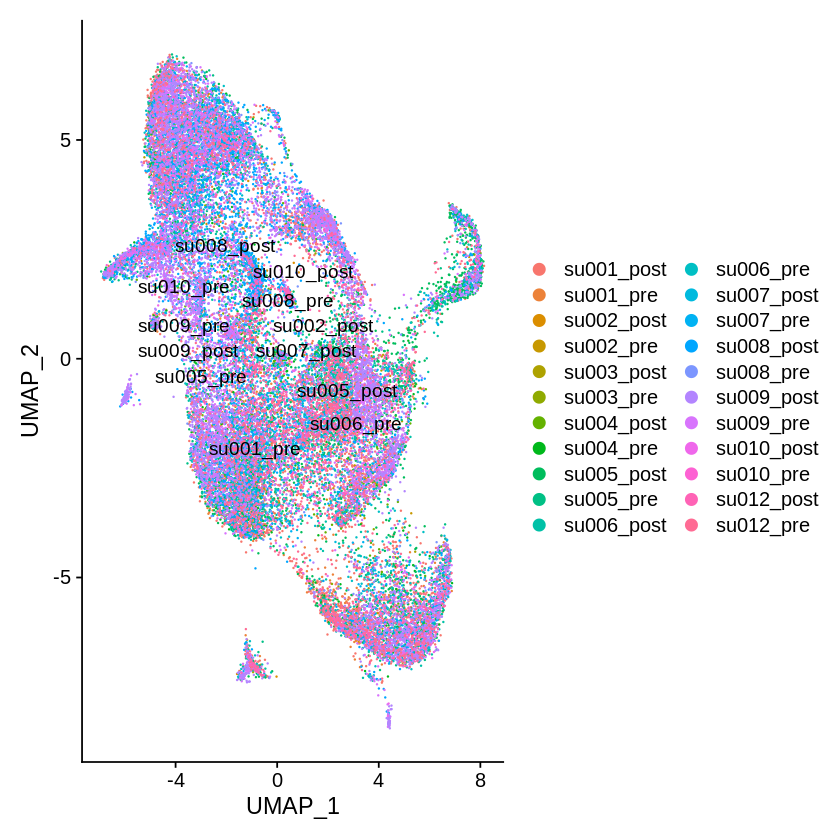

In [88]:
p1 <- DimPlot(object = bcc.integrated, reduction = "umap", group.by = "stim", label = TRUE, repel = TRUE)
plot_grid(p1,label_size = 30)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/umap_stim.pdf",width=10,height=10)

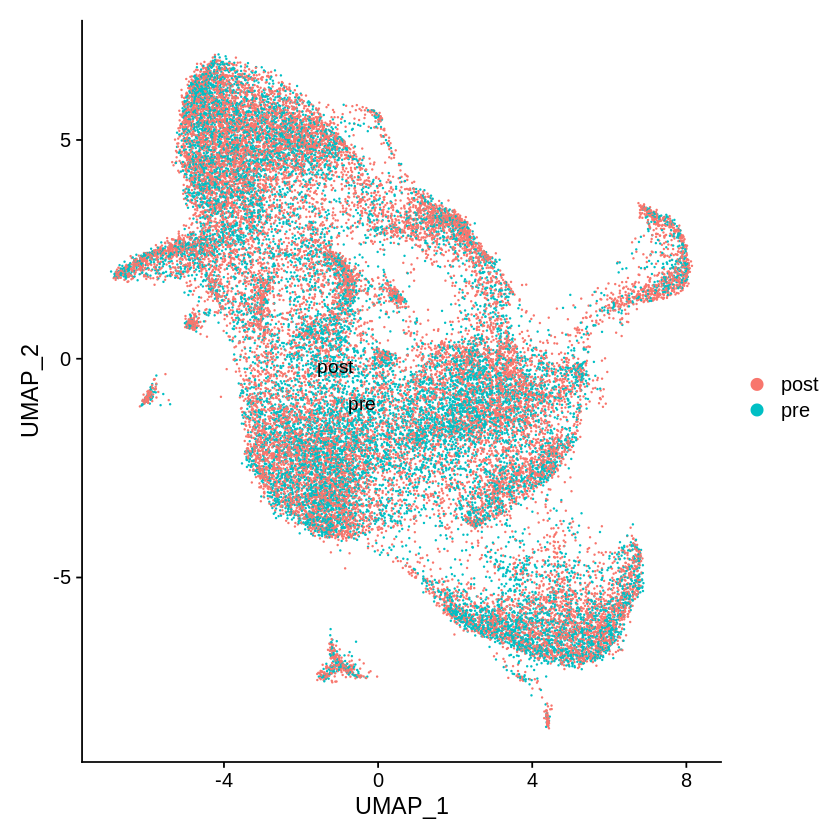

In [89]:
p1 <- DimPlot(object = bcc.integrated, reduction = "umap", group.by = "treatment", label = TRUE, repel = TRUE)
plot_grid(p1,label_size = 30)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/umap_treatment.pdf",width=10,height=10)

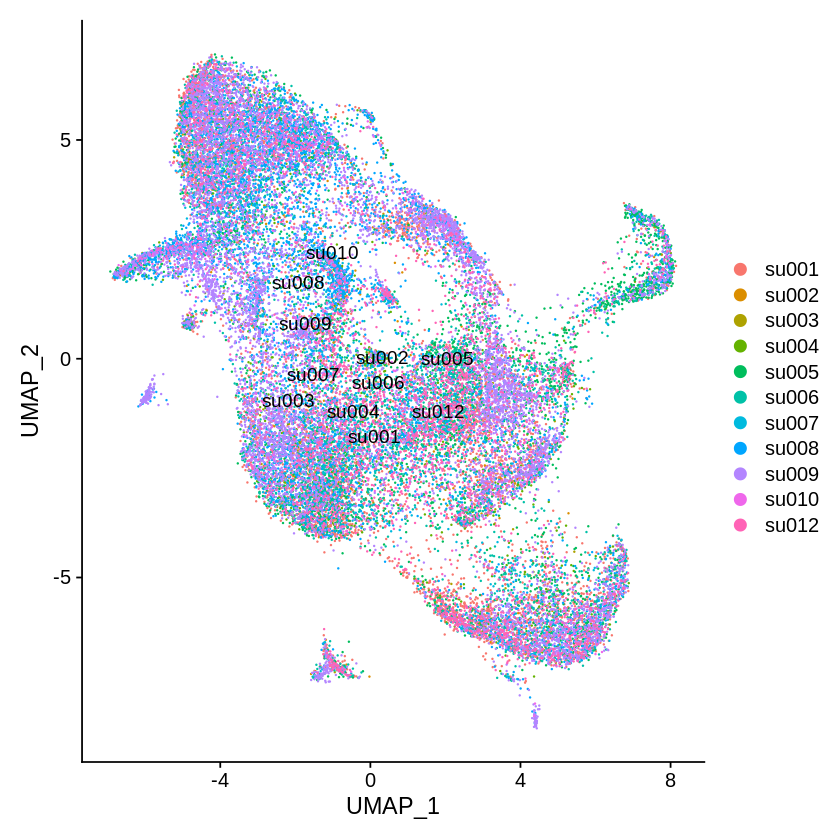

In [90]:
p1 <- DimPlot(object = bcc.integrated, reduction = "umap", group.by = "patient", label = TRUE, repel = TRUE)
plot_grid(p1,label_size = 30)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/umap_patient.pdf",width=10,height=10)

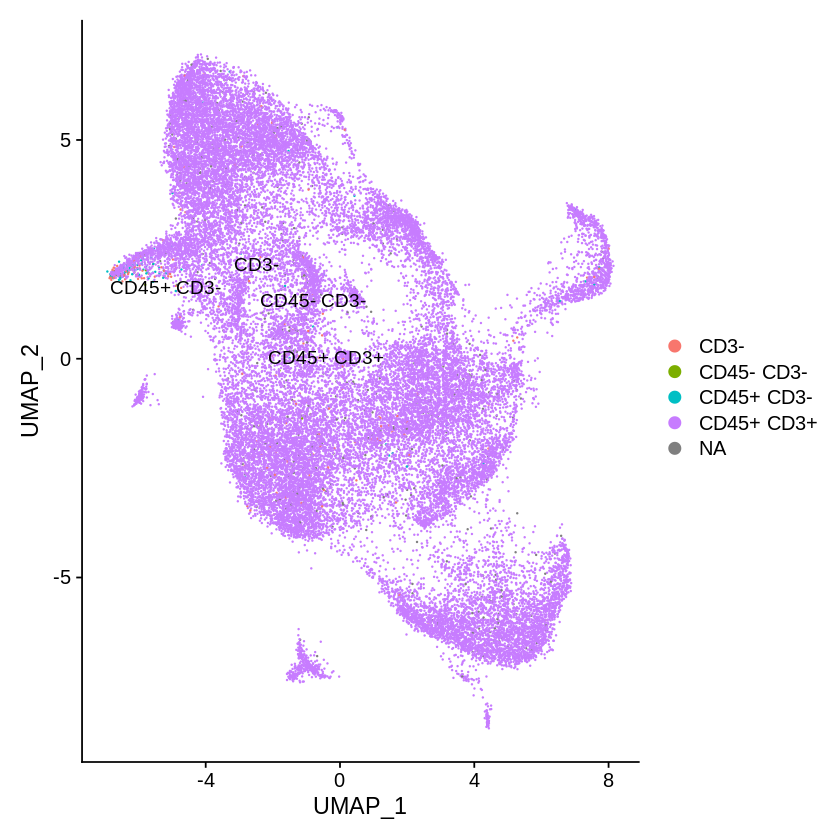

In [91]:
p1 <- DimPlot(object = bcc.integrated, reduction = "umap", group.by = "sort", label = TRUE, repel = TRUE)
plot_grid(p1,label_size = 30)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/umap_sort.pdf",width=10,height=10)

# integrated analysis

In [92]:
#used default setting
DefaultAssay(object = bcc.integrated) <- "integrated"
bcc.integrated <- FindNeighbors(object = bcc.integrated)
bcc.integrated <- FindClusters(bcc.integrated, resolution = 0.6)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 33106
Number of edges: 1048061

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8697
Number of communities: 12
Elapsed time: 6 seconds


In [93]:
library(ggplot2)

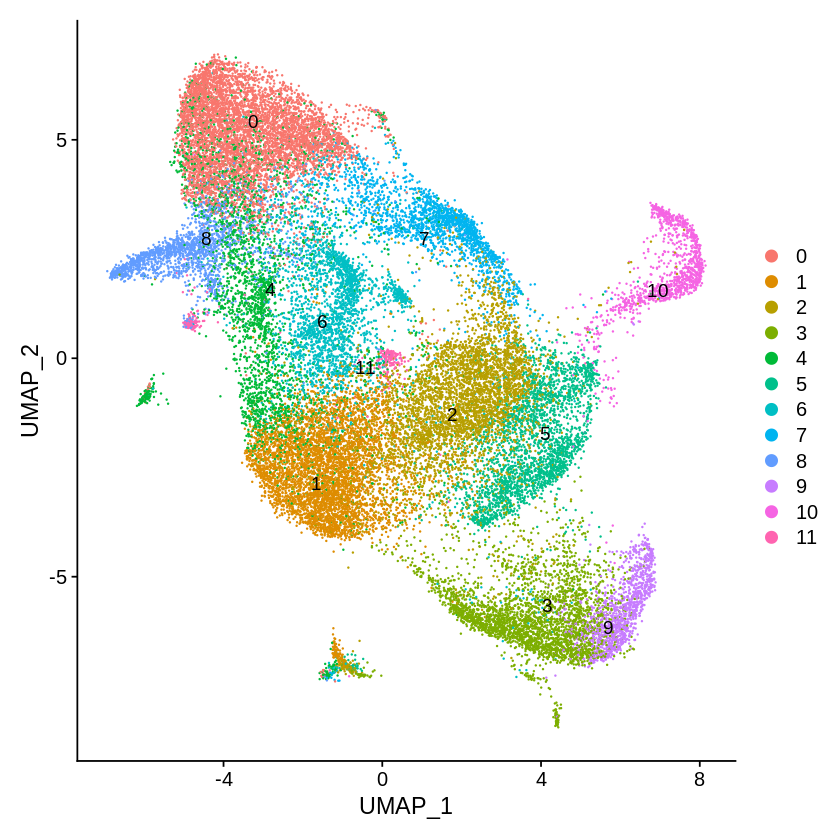

In [94]:
DimPlot(object = bcc.integrated, reduction = "umap", group.by = "integrated_snn_res.0.6", label = TRUE, repel = TRUE) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/umap_number_0.6.pdf",width=10,height=10)

In [95]:
# this is important
DefaultAssay(bcc.integrated) <- "RNA"

In [96]:
saveRDS(bcc.integrated, file = "/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/bcc.integrated.rds")

# Visualizing gene expression in UMAP space

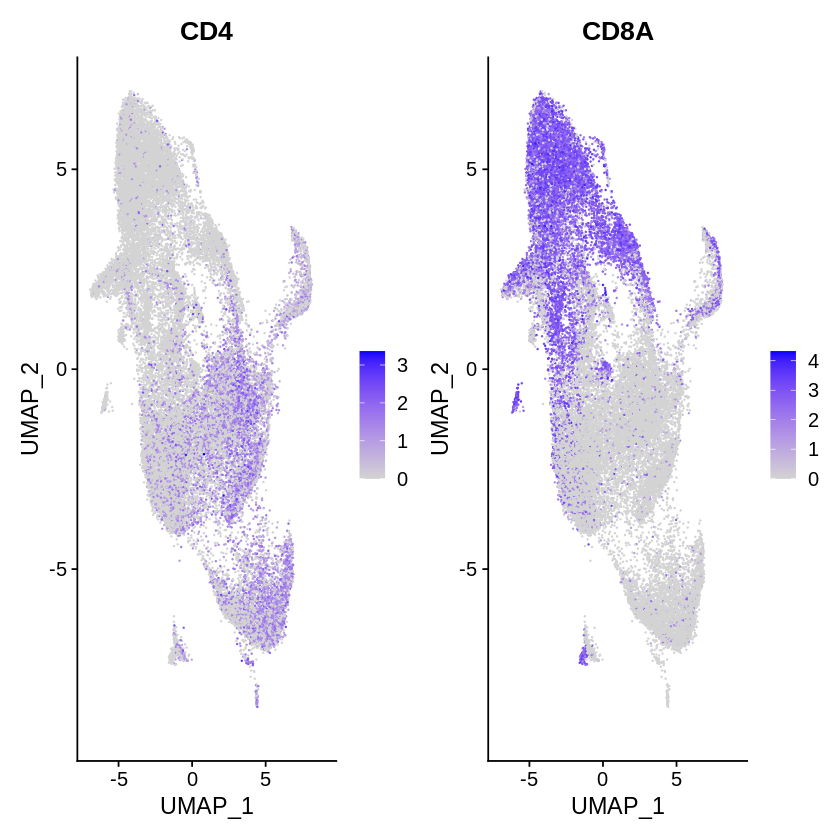

In [97]:
#CD4 and CD8 T cells
FeaturePlot(object =bcc.integrated, features = c("CD4","CD8A"), cols = c("lightgrey", "blue"))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/T_UMAP_feature_CD4_CD8A.pdf",width=10,height=10)

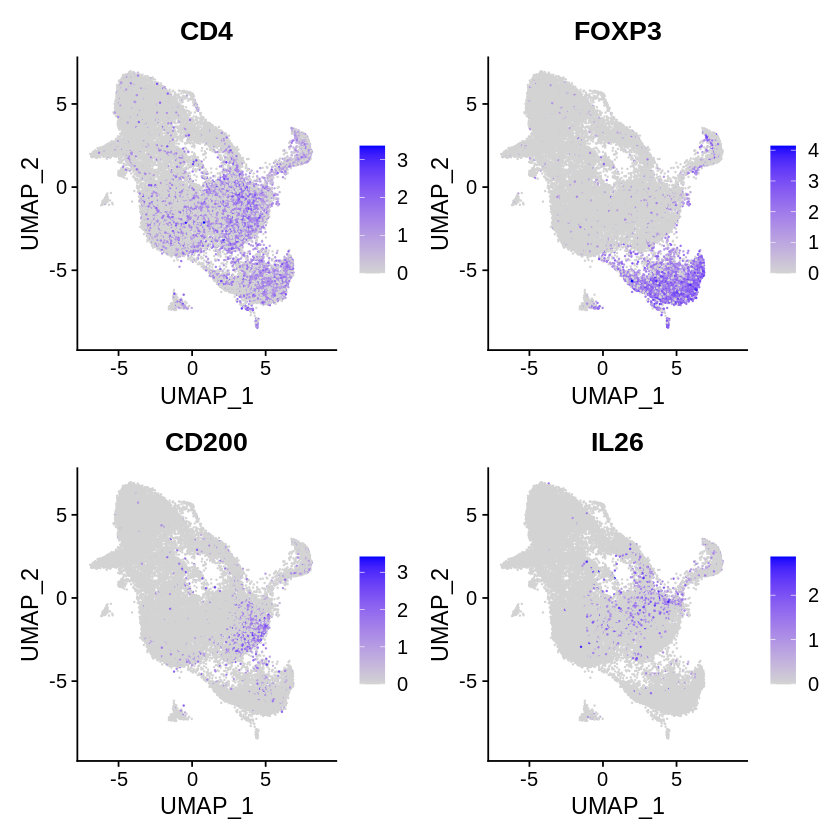

In [98]:
#CD4 subtypes
FeaturePlot(object =bcc.integrated, features = c("CD4","FOXP3","CD200","IL26"), cols = c("lightgrey", "blue"))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/T_UMAP_feature_CD4_FOXP3_CD200_IL26.pdf",width=10,height=10)

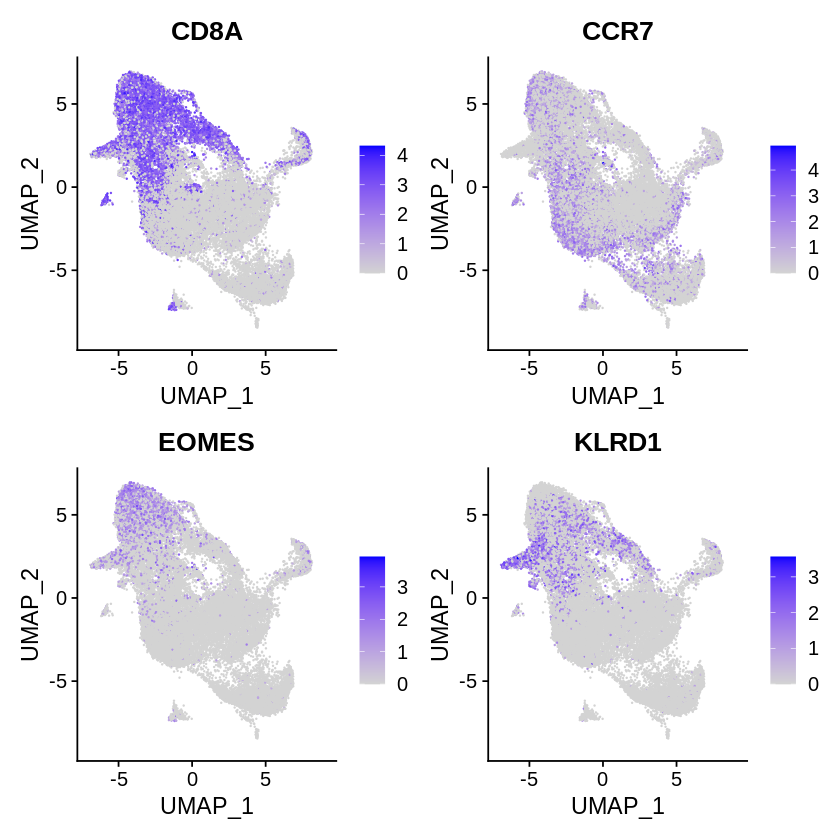

In [99]:
#CD8 subtype1
FeaturePlot(object =bcc.integrated, features = c("CD8A","CCR7","EOMES","KLRD1"), cols = c("lightgrey", "blue"))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/T_UMAP_feature_CD8A_CCR7_EOMES_KLRD1.pdf",width=10,height=10)

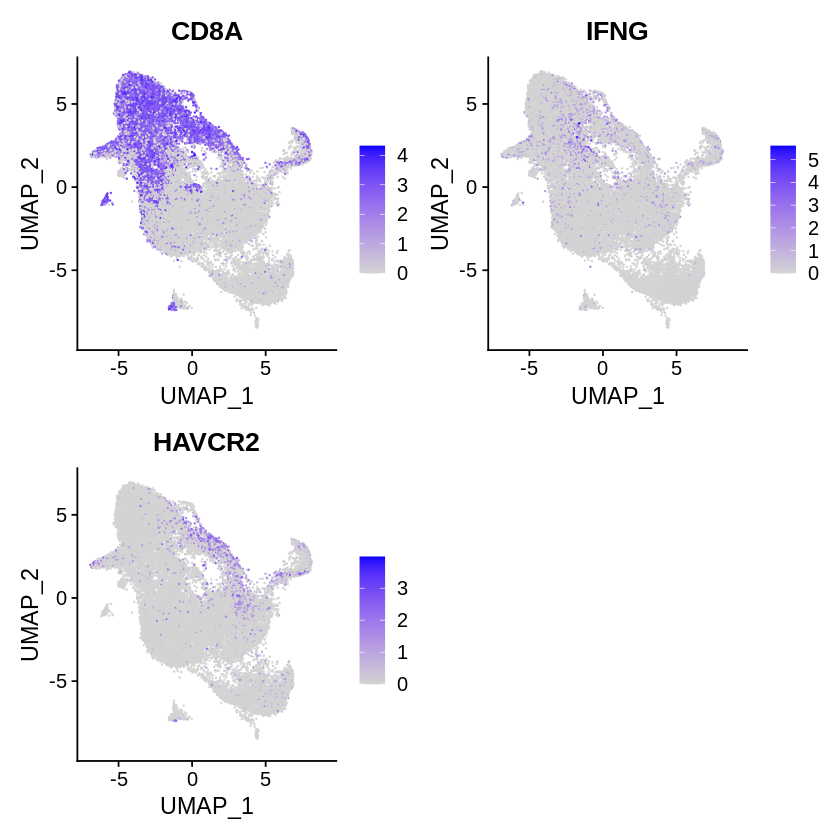

In [100]:
#CD8 subtype2
FeaturePlot(object =bcc.integrated, features = c("CD8A","IFNG","HAVCR2"), cols = c("lightgrey", "blue"))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/T_UMAP_feature_CD8A_IFNG_HAVCR2.pdf",width=10,height=10)

# Upload seurat object. You can start from here

In [101]:
# res 0.6
bcc.integrated<-readRDS(file =  "/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/bcc.integrated.rds")
# this is important
DefaultAssay(bcc.integrated) <- "RNA"

# assgin clusters to cell types

In [125]:
new.ident <- c("Memory_Tcell","Naive_Tcell1","Th17cell","Treg1","Activated_Tcell1",
               "TFH","Activated_Tcell2","Activated_exhausted_Tcell","Effector_memory_Tcell","Treg2",
               "Exhausted_Tcell","Naive_Tcell2")
names(x = new.ident) <- levels(x =bcc.integrated)
bcc.integrated<- RenameIdents(object =bcc.integrated, new.ident)

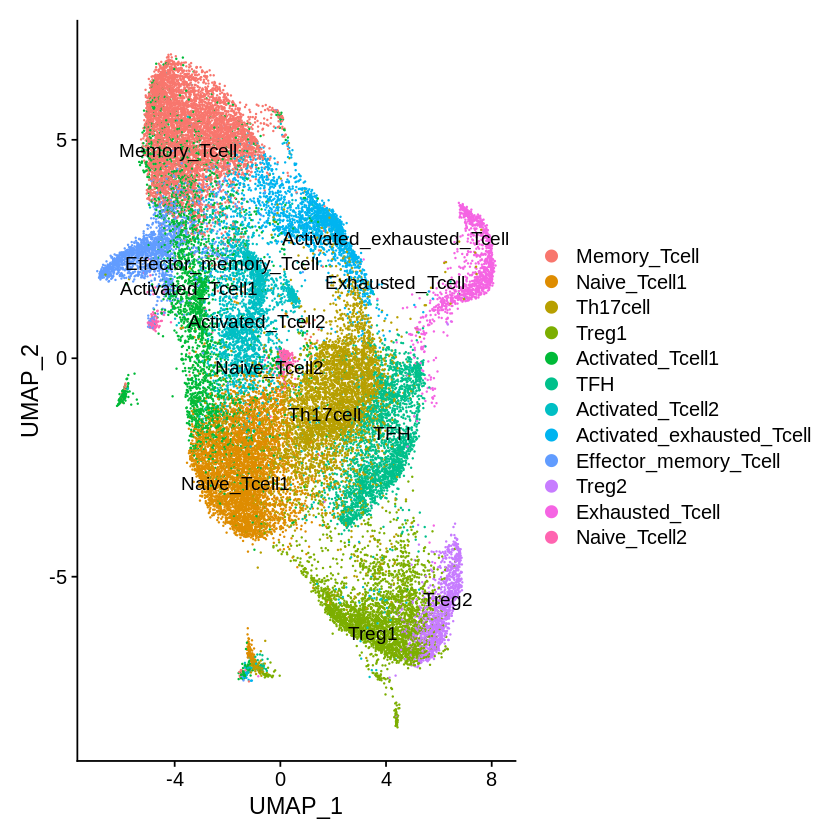

In [126]:
DimPlot(object = bcc.integrated, reduction = "umap", label.size =4, label = TRUE, repel = TRUE) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/Tcell_umap_name.pdf",width=15,height=10)

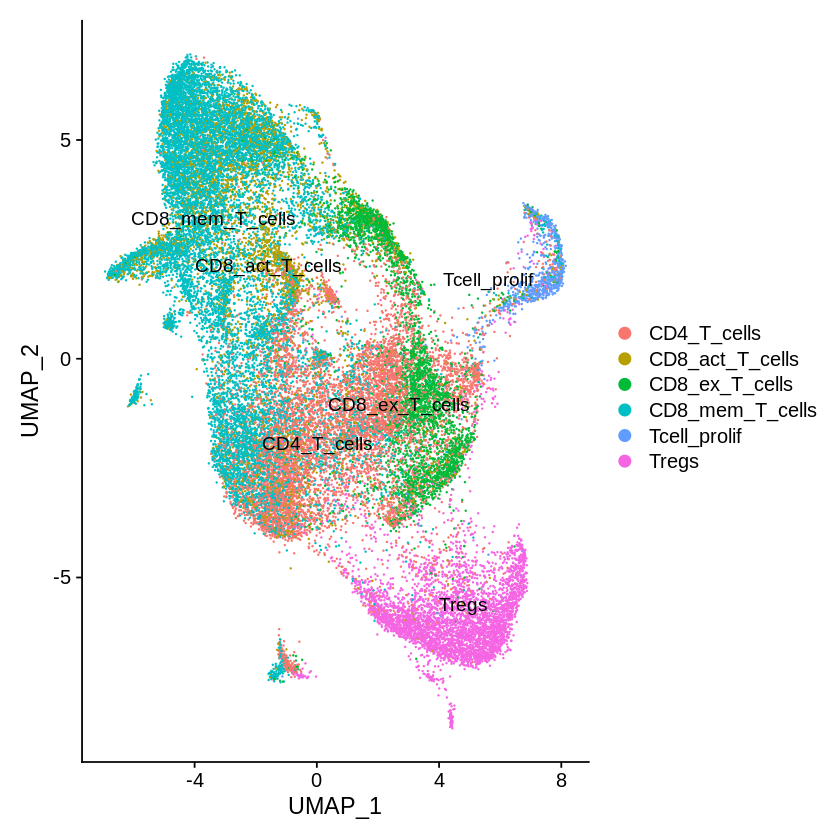

In [127]:
# comparision with my original cluster
p1 <- DimPlot(object = bcc.integrated, reduction = "umap", group.by = "original_cluster", label = TRUE, repel = TRUE)
plot_grid(p1,label_size = 30)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/T_cell_umap_original_cluster.pdf",width=10,height=10)

In [128]:
for (i in 1:length(new.ident)){
assign(paste(new.ident[i],"_barcode",sep=""),colnames(bcc.integrated@assays$RNA@data[,which(Idents(object=bcc.integrated) %in% new.ident[i])]))# this gives all barcodes in cluster
}

In [129]:
CD8<-c(Memory_Tcell_barcode,Naive_Tcell1_barcode,Naive_Tcell2_barcode,Activated_Tcell1_barcode,Activated_Tcell2_barcode,Activated_exhausted_Tcell_barcode,Effector_memory_Tcell_barcode,Exhausted_Tcell_barcode)

In [130]:
saveRDS(CD8, file = "/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/CD8_id.rds")

# conserved markers for clusters

In [8]:
#DefaultAssay(bcc.integrated) <- "RNA"


In [110]:
for (i in 1:length(new.ident)){
one.markers <- FindConservedMarkers(bcc.integrated, ident.1 = new.ident[i], grouping.var = "stim",print.bar = FALSE, min.cells.feature = 1,min.cells.group = 3)
write.xlsx2(one.markers,file=(paste("/media/garret/New Volume/scRNAseq_data/Personalis/Tcell/marker/",new.ident[i],"_gene.xlsx",sep="")))}

Testing group su002_pre: (Memory_Tcell) vs (Naive_Tcell1, Th17cell, Effector_memory_Tcell, Naive_Tcell2, Activated_exhausted_Tcell, Treg1, Treg2, Exhausted_Tcell, TFH, Activated_Tcell)

Testing group su003_pre: (Memory_Tcell) vs (TFH, Activated_Tcell, Effector_memory_Tcell, Treg1, Naive_Tcell1, Th17cell, Naive_Tcell2, Treg2, Activated_exhausted_Tcell)

Testing group su010_pre: (Memory_Tcell) vs (Naive_Tcell2, Naive_Tcell1, Effector_memory_Tcell, Treg1, Activated_exhausted_Tcell, Activated_Tcell, Th17cell, Treg2, TFH, Exhausted_Tcell)

Testing group su003_post: (Memory_Tcell) vs (Activated_Tcell, Th17cell, Naive_Tcell2, Activated_exhausted_Tcell, Naive_Tcell1, TFH, Treg1, Naive_Tcell3, Treg2, Exhausted_Tcell, Effector_memory_Tcell)

Testing group su002_post: (Memory_Tcell) vs (TFH, Activated_Tcell, Th17cell, Naive_Tcell1, Naive_Tcell2, Effector_memory_Tcell, Activated_exhausted_Tcell, Treg1, Exhausted_Tcell, Treg2)

Testing group su007_post: (Memory_Tcell) vs (Naive_Tcell2, Th17cell, Tr

Testing group su009_pre: (Naive_Tcell1) vs (Memory_Tcell, Th17cell, Exhausted_Tcell, TFH, Naive_Tcell2, Activated_exhausted_Tcell, Effector_memory_Tcell, Treg1, Treg2, Activated_Tcell, Naive_Tcell3)

Testing group su009_post: (Naive_Tcell1) vs (Memory_Tcell, Naive_Tcell2, Effector_memory_Tcell, Activated_exhausted_Tcell, Th17cell, Treg2, Naive_Tcell3, Activated_Tcell, TFH, Treg1, Exhausted_Tcell)

Testing group su002_pre: (Th17cell) vs (Naive_Tcell1, Effector_memory_Tcell, Naive_Tcell2, Activated_exhausted_Tcell, Treg1, Treg2, Exhausted_Tcell, TFH, Activated_Tcell, Memory_Tcell)

Testing group su003_pre: (Th17cell) vs (Memory_Tcell, TFH, Activated_Tcell, Effector_memory_Tcell, Treg1, Naive_Tcell1, Naive_Tcell2, Treg2, Activated_exhausted_Tcell)

Testing group su010_pre: (Th17cell) vs (Naive_Tcell2, Naive_Tcell1, Effector_memory_Tcell, Treg1, Activated_exhausted_Tcell, Activated_Tcell, Memory_Tcell, Treg2, TFH, Exhausted_Tcell)

Testing group su003_post: (Th17cell) vs (Activated_Tcell, 

ERROR: Error in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, : Cell group 1 has fewer than 3 cells
